# Демозаикинг

***

In [ ]:
# if not installed
# !pip install colour-demosaicing==0.2.6

In [3]:
# нужно, чтобы cv2 открывал exr изображения
import os
os.environ["OPENCV_IO_ENABLE_OPENEXR"]="1"

In [2]:
from pathlib import Path

import cv2

import colour

from colour_demosaicing import (
    demosaicing_CFA_Bayer_bilinear,
    demosaicing_CFA_Bayer_Malvar2004,
    demosaicing_CFA_Bayer_Menon2007,
    mosaicing_CFA_Bayer)

import matplotlib.pyplot as plt
import numpy as np

In [4]:
LIGHTHOUSE_IMG_PATH = "data/lighthouse.exr"

if not Path(LIGHTHOUSE_IMG_PATH).exists():
    !git clone https://github.com/alexmelekhin/cv_course_2025.git
    !mv cv_course_2025/seminars/seminar_02/data .

In [5]:
rgb_img = cv2.imread(LIGHTHOUSE_IMG_PATH, cv2.IMREAD_UNCHANGED)[:, :, ::-1]
rgb_img = colour.cctf_encoding(rgb_img)
rgb_img.dtype

dtype('float64')

In [6]:
rgb_img.shape

(768, 512, 3)

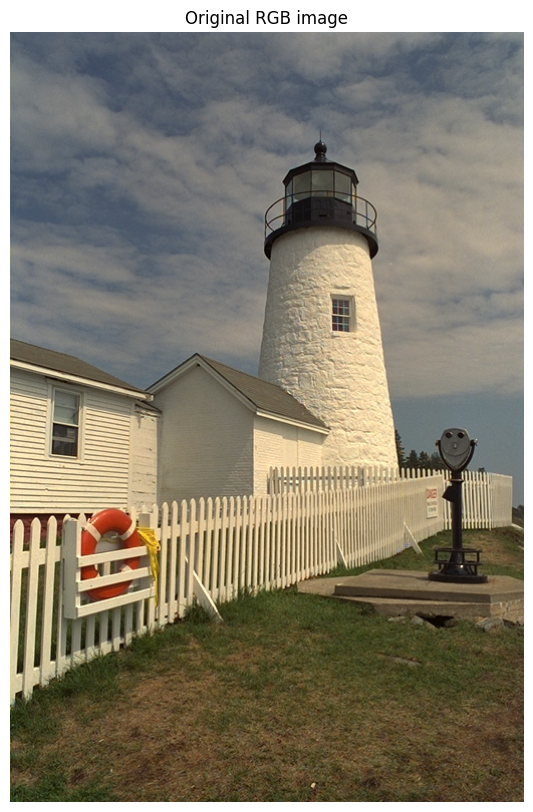

In [7]:
plt.figure(figsize=[10, 10])
plt.axis("off")
plt.title("Original RGB image")
plt.imshow(rgb_img);

In [9]:
mosaiced_image = mosaicing_CFA_Bayer(rgb_img, pattern="RGGB")
mosaiced_image.shape

(768, 512)

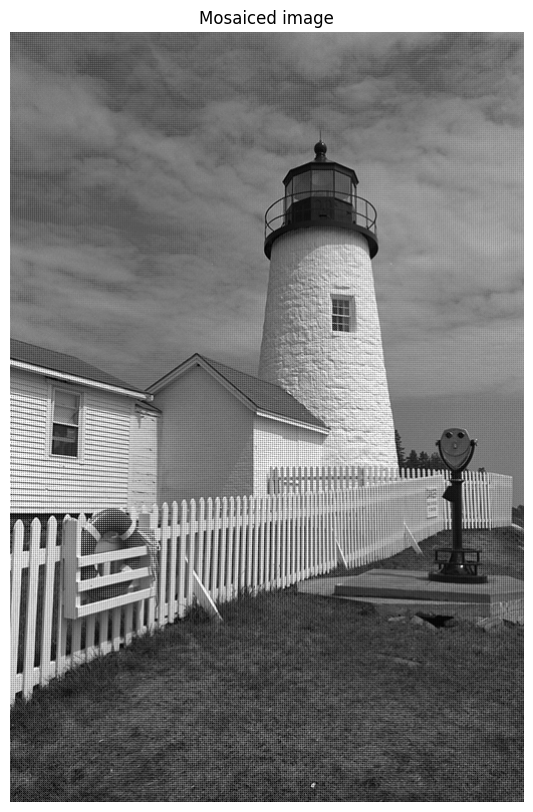

In [10]:
plt.figure(figsize=[10, 10])
plt.axis("off")
plt.title("Mosaiced image")
plt.imshow(mosaiced_image, cmap="gray");

In [11]:
def separate_chanel_rggb(img):
    new_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=img.dtype)
    new_img[0::2, 0::2, 0] = img[0::2, 0::2]  # R
    new_img[0::2, 1::2, 1] = img[0::2, 1::2]  # G1
    new_img[1::2, 0::2, 1] = img[0::2, 1::2]  # G2
    new_img[1::2, 1::2, 2] = img[0::2, 1::2]  # B
    return new_img

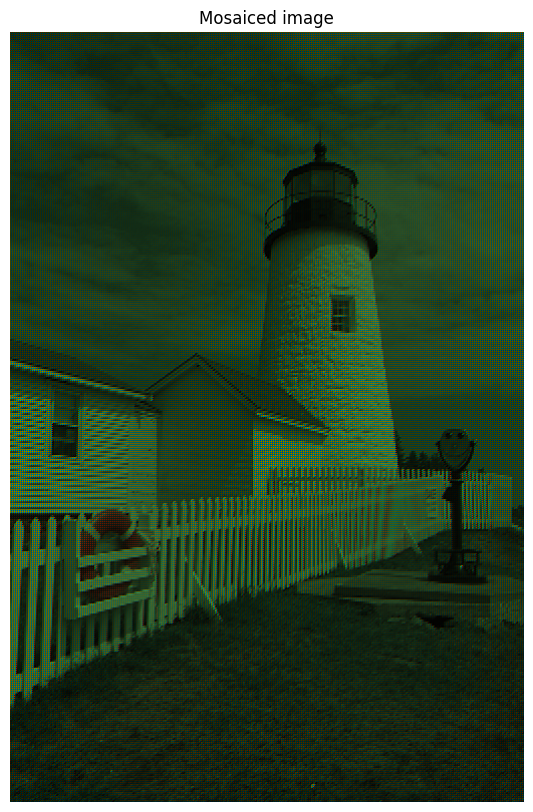

In [12]:
plt.figure(figsize=[10, 10])
plt.axis("off")
plt.title("Mosaiced image")
plt.imshow(separate_chanel_rggb(mosaiced_image));

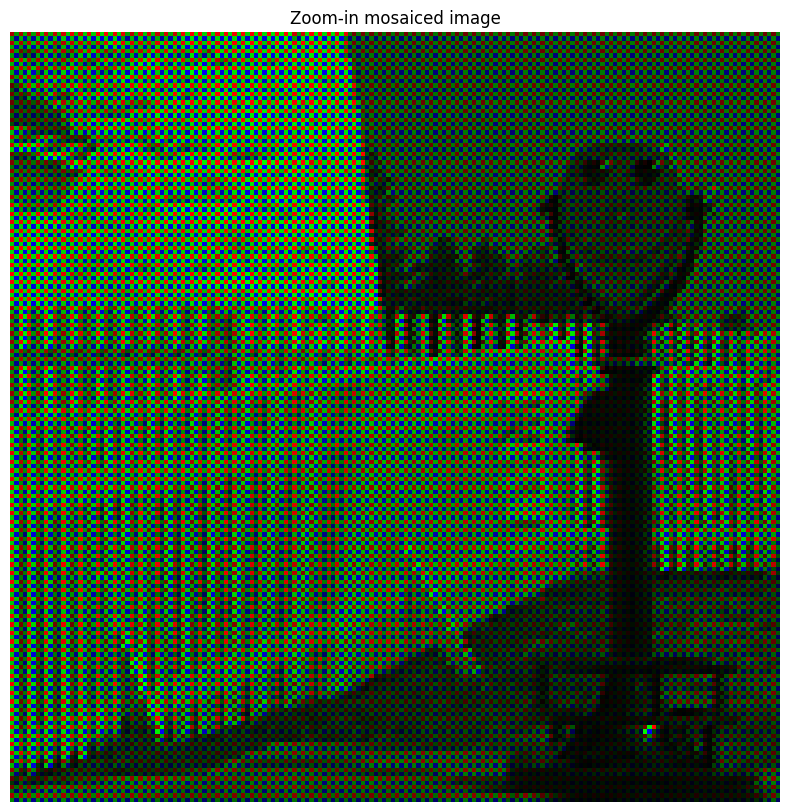

In [13]:
plt.figure(figsize=[10, 10])
plt.axis("off")
plt.title("Zoom-in mosaiced image")
plt.imshow(separate_chanel_rggb(mosaiced_image)[370:550, 300:480]);

# Bilinear

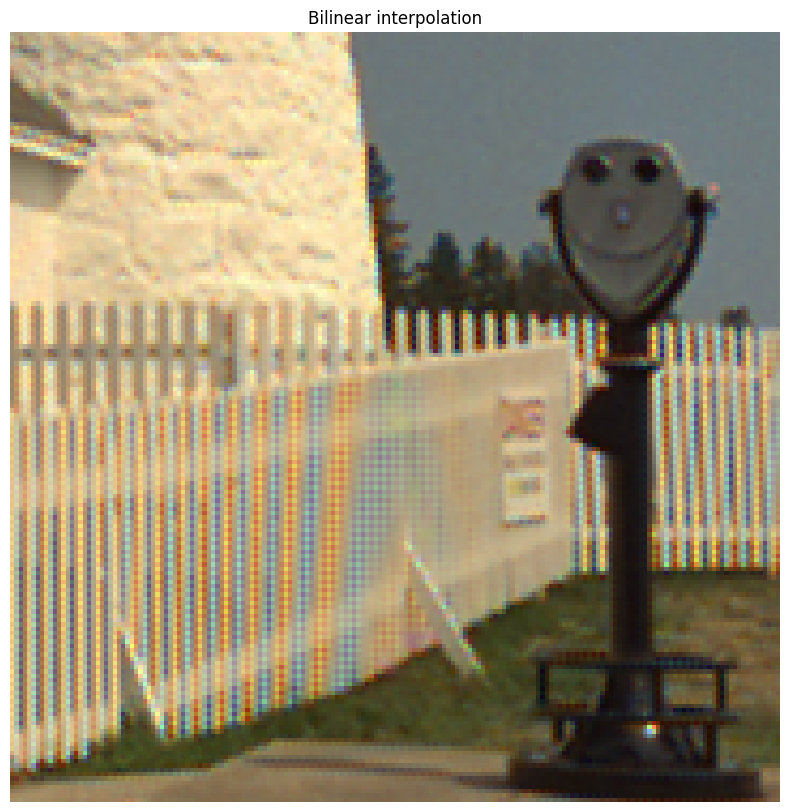

In [14]:
plt.figure(figsize=[10, 10])
plt.axis("off")
plt.title("Bilinear interpolation")
plt.imshow(demosaicing_CFA_Bayer_bilinear(mosaiced_image)[370:550, 300:480]);

# Malvar (2004)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.150967075323..1.13555307103].


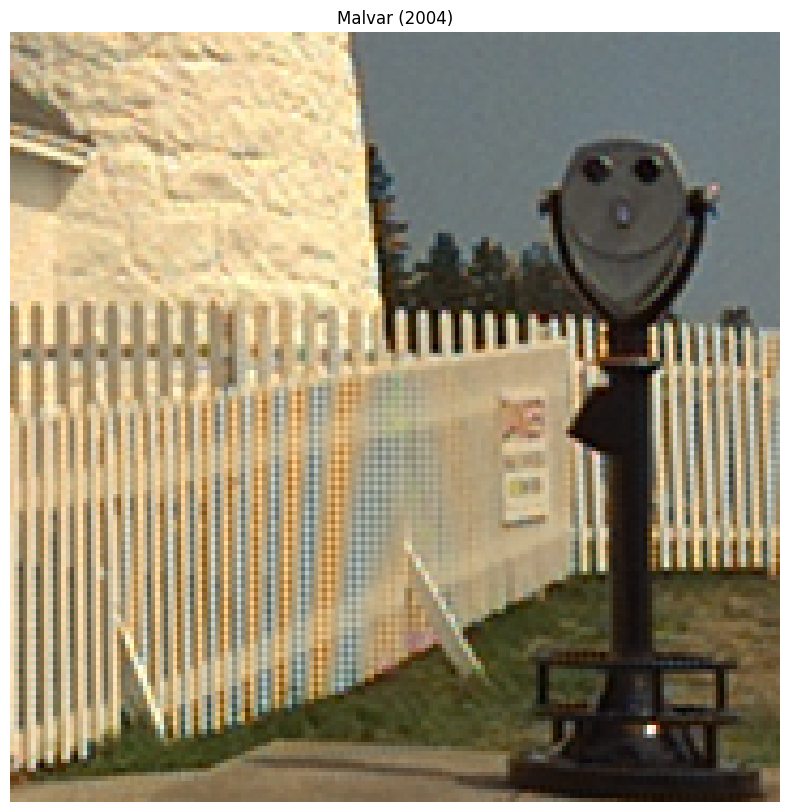

In [15]:
plt.figure(figsize=[10, 10])
plt.axis("off")
plt.title("Malvar (2004)")
plt.imshow(demosaicing_CFA_Bayer_Malvar2004(mosaiced_image)[370:550, 300:480]);

# Menon (2007)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0763961363791..1.0977723342].


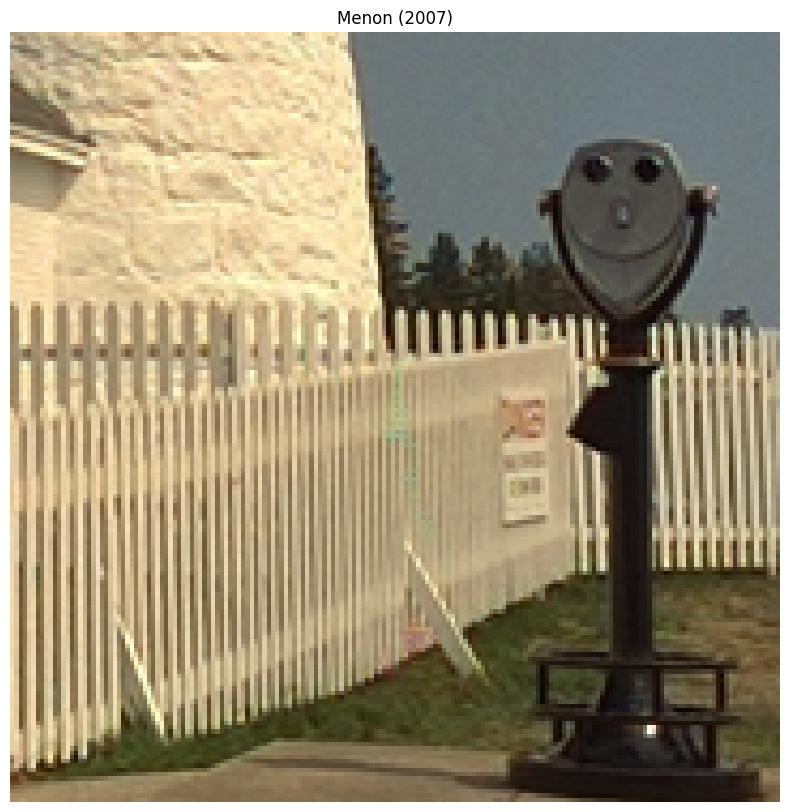

In [16]:
plt.figure(figsize=[10, 10])
plt.axis("off")
plt.title("Menon (2007)")
plt.imshow(demosaicing_CFA_Bayer_Menon2007(mosaiced_image)[370:550, 300:480]);

# Домашнее задание (опциональное, неоцениваемое)

Вы часто будете сталкиваться с изображениями в RAW-формате при работе с индустриальными камерами и датасетами в области робототехники и беспилотного транспорта.

Например, датасет Oxford RobotCar содержит изображения в формате Bayer GBRG 8-bit (для камеры stereo).

In [17]:
OXFORD_SAMPLE_1_PATH = "data/oxford_robotcar_sample_1.png"
OXFORD_SAMPLE_2_PATH = "data/oxford_robotcar_sample_2.png"

if not Path(OXFORD_SAMPLE_1_PATH).exists():
    !git clone https://github.com/alexmelekhin/cv_course_2025.git
    !mv cv_course_2025/seminars/seminar_02/data .

In [18]:
oxford_img_1 = cv2.imread(OXFORD_SAMPLE_1_PATH, cv2.IMREAD_UNCHANGED)
oxford_img_2 = cv2.imread(OXFORD_SAMPLE_2_PATH, cv2.IMREAD_UNCHANGED)

oxford_img_1.shape, oxford_img_1.dtype

((960, 1280), dtype('uint8'))

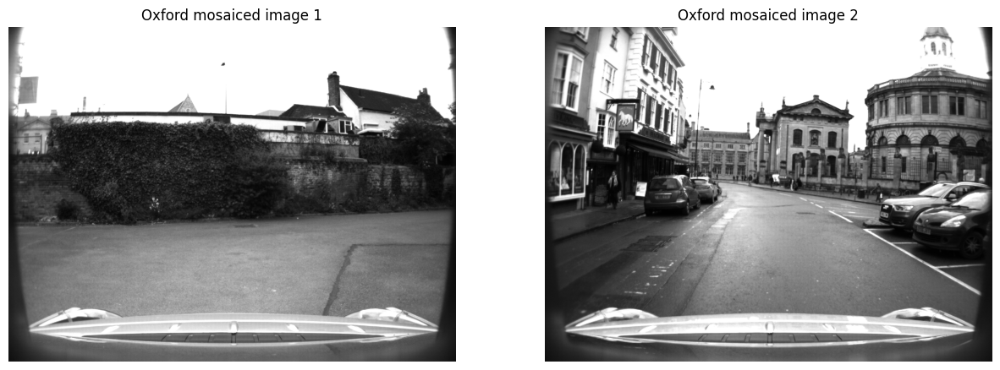

In [19]:
plt.figure(figsize=[15, 10])
plt.subplot(1, 2, 1)
plt.axis("off")
plt.title("Oxford mosaiced image 1")
plt.imshow(oxford_img_1, cmap="gray")
plt.subplot(1, 2, 2)
plt.axis("off")
plt.title("Oxford mosaiced image 2")
plt.imshow(oxford_img_2, cmap="gray");

## Задание

Попробуйте разные алгоритмы демозаикинга на изображениях из RobotCar. Найдите участки с артефактами и сравните их между собой.

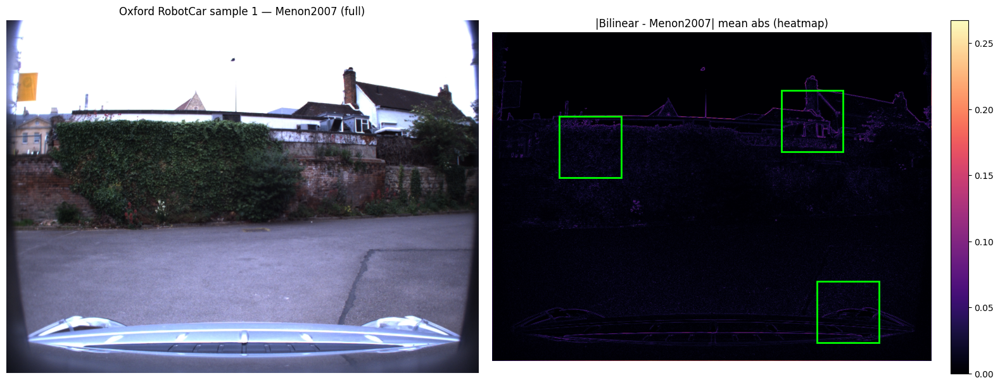

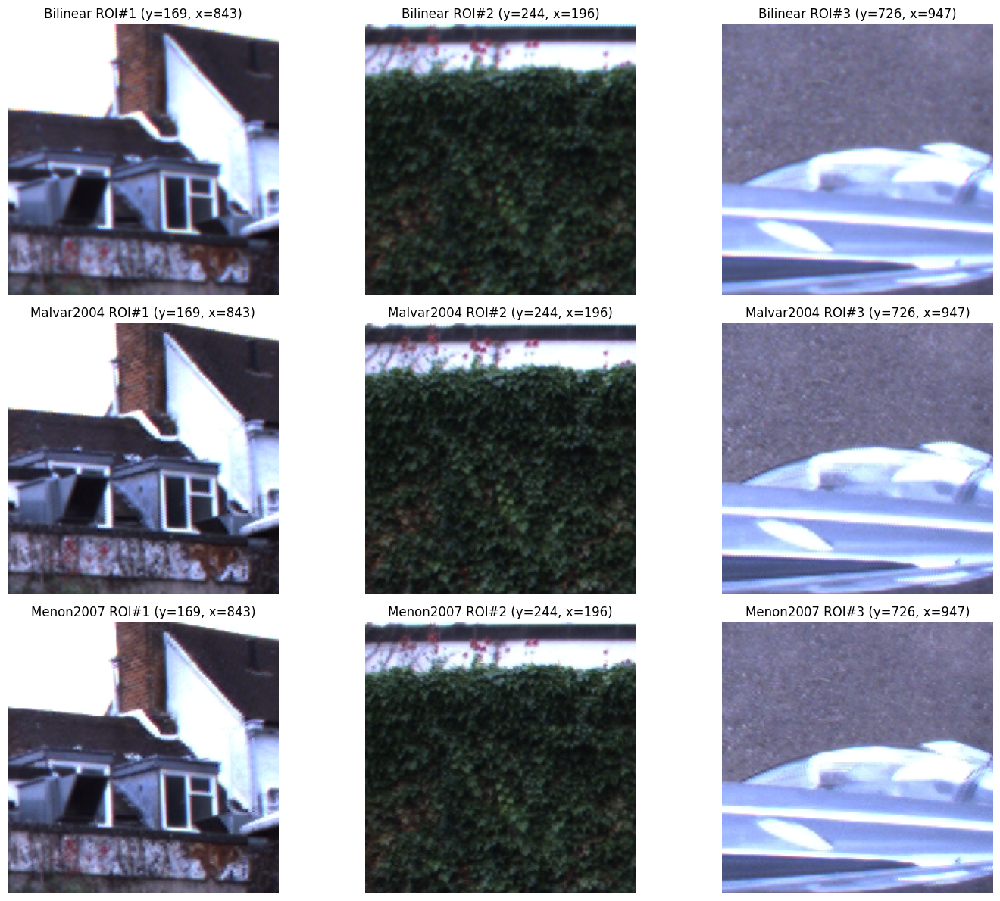

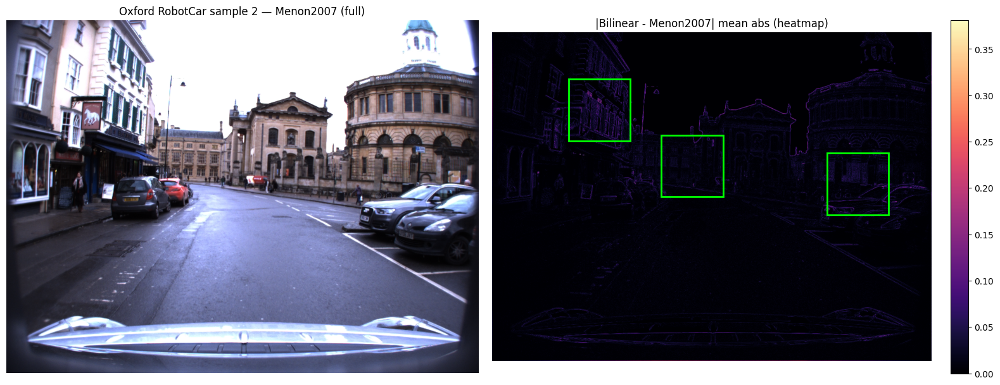

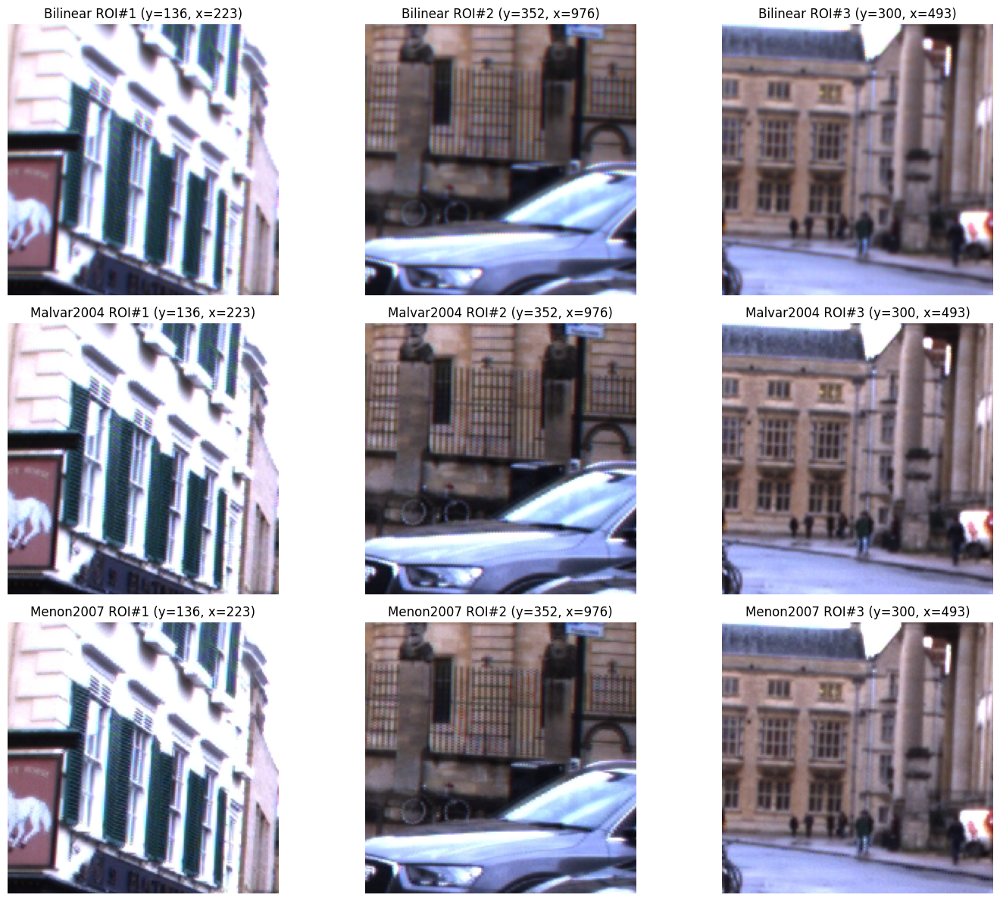

In [21]:
PATTERN = "GBRG" 


def _to_float01(img_rgb: np.ndarray) -> np.ndarray:
    """Привести RGB к float в [0,1] для корректного отображения."""
    img = img_rgb.astype(np.float32, copy=False)
    mx = float(img.max()) if img.size else 1.0
    if mx > 1.5:
        img = img / 255.0
    return np.clip(img, 0.0, 1.0)


def demosaic_all(cfa: np.ndarray, pattern: str = PATTERN) -> dict:
    """Запустить несколько алгоритмов демозаикинга из colour-demosaicing."""
    cfa_u8 = cfa.astype(np.uint8, copy=False)
    out = {
        "Bilinear": demosaicing_CFA_Bayer_bilinear(cfa_u8, pattern=pattern),
        "Malvar2004": demosaicing_CFA_Bayer_Malvar2004(cfa_u8, pattern=pattern),
        "Menon2007": demosaicing_CFA_Bayer_Menon2007(cfa_u8, pattern=pattern),
    }
    return {k: _to_float01(v) for k, v in out.items()}


def find_rois(diff_map: np.ndarray, patch: int = 180, n: int = 3) -> list:
    """Найти несколько ROI, где алгоритмы сильнее всего расходятся.

    diff_map: (H,W) карта различий.
    Возвращает список (y, x, patch).
    """
    H, W = diff_map.shape
    patch = int(min(patch, H, W))
    if patch < 16:
        return [(0, 0, patch)]

    # Сумма различий на патче через box-filter
    k = patch
    kernel = np.ones((k, k), dtype=np.float32)
    score = cv2.filter2D(diff_map.astype(np.float32), -1, kernel, borderType=cv2.BORDER_REFLECT)

    rois = []
    taken = np.zeros_like(score, dtype=bool)
    for _ in range(n):
        # игнорируем уже занятые области
        s = score.copy()
        s[taken] = -1
        idx = np.unravel_index(np.argmax(s), s.shape)
        y0, x0 = int(idx[0] - k // 2), int(idx[1] - k // 2)
        y0 = int(np.clip(y0, 0, H - k))
        x0 = int(np.clip(x0, 0, W - k))
        rois.append((y0, x0, k))

        # запретим соседство, чтобы ROI не слипались
        y1 = max(0, y0 - k)
        y2 = min(H, y0 + 2 * k)
        x1 = max(0, x0 - k)
        x2 = min(W, x0 + 2 * k)
        taken[y1:y2, x1:x2] = True

    return rois


def show_comparison(cfa: np.ndarray, title: str):
    res = demosaic_all(cfa, pattern=PATTERN)

    # карта различий (где Bilinear и Menon расходятся) — там обычно видны артефакты
    diff = np.mean(np.abs(res["Bilinear"] - res["Menon2007"]), axis=2)
    rois = find_rois(diff, patch=180, n=3)

    # 1) Полное изображение + карта diff
    fig, axs = plt.subplots(1, 2, figsize=(16, 6))
    axs[0].imshow(res["Menon2007"])
    axs[0].set_title(f"{title} — Menon2007 (full)")
    axs[0].axis("off")

    im = axs[1].imshow(diff, cmap="magma")
    axs[1].set_title("|Bilinear - Menon2007| mean abs (heatmap)")
    axs[1].axis("off")
    plt.colorbar(im, ax=axs[1], fraction=0.046, pad=0.04)

    for (y0, x0, k) in rois:
        rect = plt.Rectangle((x0, y0), k, k, fill=False, edgecolor="lime", linewidth=2)
        axs[1].add_patch(rect)

    plt.tight_layout()
    plt.show()

    # 2) Зумы по ROI для всех алгоритмов
    algo_names = list(res.keys())
    fig, axs = plt.subplots(len(algo_names), len(rois), figsize=(5 * len(rois), 4 * len(algo_names)))
    if len(rois) == 1:
        axs = np.expand_dims(axs, axis=1)

    for r, name in enumerate(algo_names):
        for c, (y0, x0, k) in enumerate(rois):
            axs[r, c].imshow(res[name][y0:y0 + k, x0:x0 + k])
            axs[r, c].set_title(f"{name} ROI#{c + 1} (y={y0}, x={x0})")
            axs[r, c].axis("off")

    plt.tight_layout()
    plt.show()
show_comparison(oxford_img_1, title="Oxford RobotCar sample 1")
show_comparison(oxford_img_2, title="Oxford RobotCar sample 2")
